In [1]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
DTYPES = {
    'overall':np.int16,
    'vote':np.int64,
    'verified':np.bool_,
    'reviewText':np.string_,
    'summary':np.string_
}

df = pd.read_csv("electronics_small.csv", dtype = DTYPES)
print("original length:", len(df.index))
df = df.dropna(subset= ["reviewText"])
print("NaN reviews dropped:", len(df.index))

original length: 3000000
NaN reviews dropped: 2999538


In [3]:
# similarities between summary and text
def check_summary_in_text(row):
    try:
        if row["summary"] in row["reviewText"]:
            return 1
        else:
            return 0
    except TypeError:
        return 0

num_summary_in_text = sum(df.apply(check_summary_in_text, axis= 1))
print(num_summary_in_text)
df

140216


,overall,vote,verified,reviewTime,reviewText,summary
0,5,67,True,1999-09-18,This is the best novel I have read in 2 or 3 y...,A star is born
1,3,5,True,2013-10-23,"Pages and pages of introspection, in the style...",A stream of consciousness novel
2,5,4,True,2008-09-02,This is the kind of novel to read when you hav...,I'm a huge fan of the author and this one did ...
3,5,13,True,2000-09-04,What gorgeous language! What an incredible wri...,The most beautiful book I have ever read!
4,3,8,True,2000-02-04,I was taken in by reviews that compared this b...,A dissenting view--In part.
...,...,...,...,...,...,...
2999995,1,0,True,2017-07-07,don't work for surface 3,One Star
2999996,5,0,True,2017-03-13,Good quality cable for Surface RT2 nice video ...,Five Stars
2999997,5,0,True,2018-01-23,The best part of this lens is its close up abi...,Five Stars
2999998,5,0,True,2017-11-09,Solidly built lens with remarkably high defini...,Best bang for the buck out there.


In [4]:
all_text = " ".join(df.apply(lambda x: x["reviewText"], axis= 1))

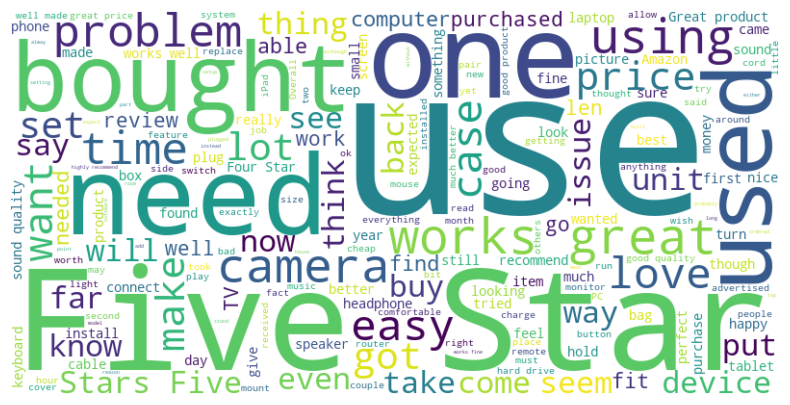

In [6]:
# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Remove axes
plt.show()

<Axes: xlabel='overall'>

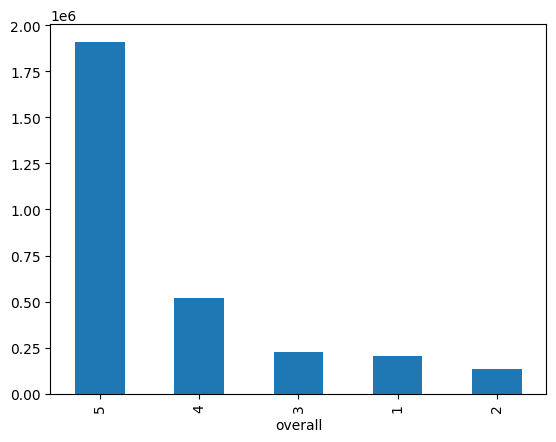

In [5]:
# rating distributions

df["overall"].value_counts().plot.bar()

In [7]:
word_array = wordcloud.process_text(text= all_text)
print(word_array)

{'best': 35631, 'novel': 361, 'read': 32037, 'everything': 30607, 'fiction': 46, 'beautifully': 1289, 'written': 2654, 'engaging': 197, 'well': 51724, 'plotted': 26, 'structured': 33, 'several': 8354, 'historical': 67, 'family': 5980, 'philosophical': 15, 'skillfully': 12, 'Interestingly': 324, 'American': 586, 'grad': 51, 'student': 1469, "writers'": 4, 'workshop': 373, 'mean': 22857, 'trivia': 16, 'look': 41919, 'childish': 38, 'silly': 1259, 'comparison': 5744, 'anyone': 18436, 'adolescent': 15, 'girl': 853, 'coming': 7266, 'age': 2601, 'story': 505, 'trivializing': 1, 'ignore': 1505, 'book': 6695, 'love': 97091, 'literature': 306, 'particularly': 3559, 'impressed': 12427, 'young': 428, 'author': 371, 'grasp': 423, 'meaning': 3279, 'texture': 1399, 'lost': 11862, 'world': 6925, 'French': 162, 'Algeria': 5, 'poignant': 4, 'another': 608, 'ruined': 1207, 'abandoned': 265, 'colony': 4, 'amid': 18, 'decaying': 12, 'hope': 14858, 'will': 66501, 'write': 6641, 'many': 21868, 'bring': 7985

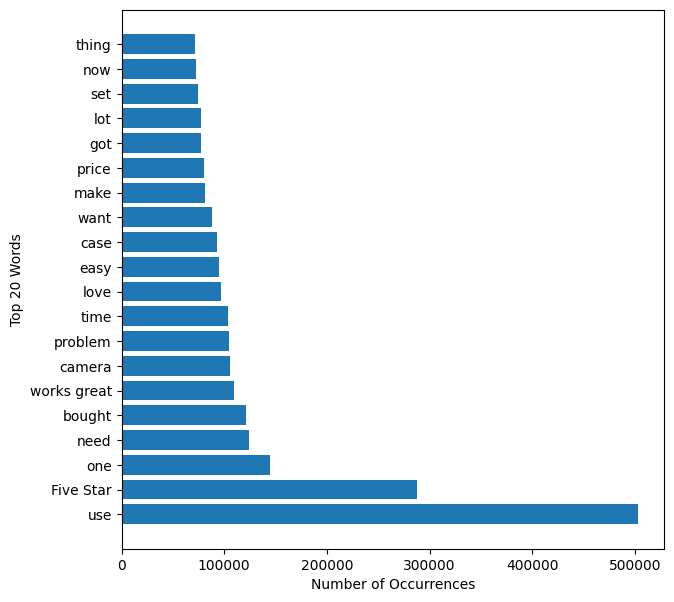

In [24]:
top_words = {"use": 503164,
             "Five Star": 215369 + 72841,
             "one": 144773,
             "need": 123767,
             "bought": 121410,
             "works great": 109639,
             "camera": 105231,
             "problem": 104964,
             "time": 103776,
             "love": 97091,
             "easy": 95160,
             "case": 92854,
             "want": 88072,
             "make": 81391,
             "price": 80508,
             "got": 77625,
             "lot": 77498,
             "set": 74534,
             "now": 72112,
             "thing": 71228}

plt.rcParams["figure.figsize"] = (7,7)
plt.barh(list(top_words.keys()), list(top_words.values()))
plt.xlabel('Number of Occurrences')
plt.ylabel('Top 20 Words')
plt.show()